# Sorting lines based on the xml files

In [ ]:
simstrimg   # matching
pysimstrimg 

unidecod

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls     xmls.zip


In [10]:
base_dir = '../../edspdf-train/data/publaynet/'

In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

## Model extractor

In [2]:
from edspdf import Pipeline

model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

In [3]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +5

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188


## Visualize a pdf and xml

## XPath

In [20]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [4]:
import io
import pydotplus
import elementpath
from lxml import etree
from copy import deepcopy
from graphviz import Source
from IPython.display import display, Image

### Fonctions d'affichage

In [5]:
xslt_dir = '../../edspdf-train/data/xslt/'

In [6]:

def printXML(element):
    # print(isinstance(element, etree._ElementTree))
    t = element if isinstance(element, etree._ElementTree) else etree.ElementTree(element)
    # t=etree.ElementTree(element)
    str=etree.tostring(t, pretty_print=True, encoding='unicode')
    print(str)
    # return str
 
        
def printXPath(xmltree,xp):
    # r=xmltree.xpath(xp)
    try:
        r=elementpath.select(xmltree,xp)
        print(f'Lenght {len(r)}')
        for x in r:
            printXML(x)
    except:
        print(f"error in expression ({xp}) or inputfile")
        

def displayXPath(xmltree,xp,pngfile="reponse"):
    # r=xmltree.xpath(xp)
    r=elementpath.select(xmltree,xp)
    reponse=etree.Element("reponse")
    for x in r:
        reponse.append(deepcopy(x))
    displayXMLInline(reponse)

    
def displayXML(t,pngfile="xpath"):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=transform(t)
    try:
        s=Source(str(s_dot),filename="gendata/"+pngfile+".dot", format="png")
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    s.view()
    
def displayXMLInline(t):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=str(transform(t))
    # print(s_dot)
    # with io.StringIO(s_dot) as f:
    #    a=nx.nx_pydot.read_dot(f)
    try:
        dg = pydotplus.graph_from_dot_data(s_dot)
        png = dg.create_png()
        display(Image(png))
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    # print(s_dot)
    # return s_dot

In [8]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [7]:
from pathlib import Path

def get_paths(file_dir):

    file_dir = Path(file_dir)
    xml_path = next(file_dir.glob("*.nxml"))
    pdf_path = next(file_dir.glob("*.pdf"))
    
    return pdf_path, xml_path


### Example 1

In [8]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [25]:
file_dir = base_dir + 'xmls/PMC1247186'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247186/ehp0112-000944.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247186/ehp0112-000944.pdf


#### Show annotations

In [26]:
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [27]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)

displayXMLInline(tree)

  -> idp140618070643424
  ^
Expected '}', found '-'  (at char 120), (line:5, col:3)
install graphviz
<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id p

In [28]:
from fuzzysearch import find_near_matches
from unidecode import unidecode
from tqdm import tqdm

# mapped text boxes
for i,tb in enumerate(doc.content_boxes):
    tb.id = i # text box id
map_tboxes = {tb.id: tb for tb in doc.content_boxes}

print('Nb text boxes:',len(map_tboxes))

def get_matches(nodes, text_boxes, nmax=None):
    l_matches = []
    for node in nodes:
        node_matches = []
        source_text = "".join(node.itertext())
        
        for tb in text_boxes:
            target_text = unidecode(tb.text)
            len_target_text = len(target_text)
            if len_target_text < 1: # text box that have no text
                continue
            
            pdmax = 0.2  if len_target_text<=20 else (\
                    0.15 if len_target_text<=40 else \
                    0.1)
            dmax = int(pdmax * len_target_text)
            
            #match
            tb_matches = find_near_matches(target_text, source_text, max_l_dist=dmax)
            if len(tb_matches) > 0: # node text matches with text box text
                node_matches.append((tb,tb_matches))
                
                if tb.id in map_tboxes: # debug
                    del(map_tboxes[tb.id])
            
        l_matches.append((node, node_matches))
        
        # just nmax nodes
        if nmax is not None:
            nmax -=1
            if nmax < 0:
                break
        
    return l_matches


Nb text boxes: 1136


#### Font, Body and tables text nodes

In [29]:
for tb in doc.content_boxes:
    tb.rank = None

In [30]:
# front 


qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff'
front_nodes = tqdm(elementpath.select(tree, qfront), mininterval=1)
front_matches = get_matches(front_nodes, doc.content_boxes)

print(f'Nb nodes {len(front_matches)}')
for it, (node, matches) in enumerate(front_matches):
    print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
    for rank, (tb,matches_tb) in enumerate(matches):
        tb.rank = rank
        tb.color = "yellow"
        tb.bg_color = "black"
        # print(f'    page {tb.page_num} --{tb.text}-- \t{tb}\t{matches_tb}')
    
    # if it >= 3: break



100%|██████████| 6/6 [00:00<00:00, 18.55it/s]

Nb nodes 6
0 
    nb matches 1 || node tag: article-title || itertext: --Neurodevelopment and Endocrine Disruption--
1 
    nb matches 1 || node tag: aff || itertext: --Department of Zoology, University of Florida, Gainesville, Florida, USA, and The Endocrine Disruption Exchange, Paonia, Colorado, USA--
2 
    nb matches 3 || node tag: corresp || itertext: --Address correspondence to T. Colborn, P.O. Box 1253, Paonia, CO 81428 USA. Telephone/Fax: (970) 527-6548. E-mail:
colborn@tds.net--
3 
    nb matches 5 || node tag: p || itertext: --I thank the Joyce Foundation, the Women’s Donor Network, and the Linda Zidell Foundation for supporting this article. In addition, I thank K. Howdeshell and M. Smolen and two unidentified individuals for reviewing this article.--
4 
    nb matches 1 || node tag: p || itertext: --The author declares no competing financial interests.--
5 
    nb matches 10 || node tag: p || itertext: --In this article I explore the possibility that contaminants contribute

In [31]:
# body 


qbody='//body//title | //body//p'
body_nodes = tqdm(elementpath.select(tree, qbody), mininterval=1)
body_matches = get_matches(body_nodes, doc.content_boxes)

print(f'Nb nodes {len(body_matches)}')
for it, (node, matches) in enumerate(body_matches):
    print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
    for rank, (tb,matches_tb) in enumerate(matches):
        tb.rank = rank
        tb.color = "black"
        tb.bg_color = "cyan"
        # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
    
    # if it >= 3: break

100%|██████████| 47/47 [00:04<00:00, 10.07it/s]

Nb nodes 47
0 
    nb matches 26 || node tag: p || itertext: --Approximately 12 years ago the scientific community acknowledged that certain synthetic chemicals are capable of crossing the placental and brain barriers and interfering with development and function (Colborn and Clement 1992). The chemicals mimic or interfere with endogenous hormones and other signaling chemicals of the endocrine system. These chemicals, distinguished as endocrine disruptors, bridge many chemical classes and are an integral part of the world economy and commerce. To date no validated or standardized screens or assays have been developed to test chemicals for their possible endocrine-disrupting effects. Consequently, none of the thousands of chemicals used today have been tested systematically for these effects for regulatory purposes. Despite this, the list is growing of known endocrine disruptors having a wide range of mechanisms of action that can interfere with brain development (Brucker-Davis 1998; Ho

In [32]:
# tables 
from copy import deepcopy

qtables='//table-wrap | //table-wrap'
qtable='//label | //caption | //th | //td | //fn'

tables=elementpath.select(tree, qtables)
ltables_matches = []

for table_tree in tables:
    table_nodes = elementpath.select(table_tree, qtable)
    
    # Merging label and caption
    label = None
    caption = None
    for ind,node in enumerate(table_nodes):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            table_nodes[label[0]] = lc
            table_nodes = table_nodes[:caption[0]] + table_nodes[1+caption[0]:]
            break
    
    table_nodes = tqdm(table_nodes, mininterval=1)
    table_matches = get_matches(table_nodes, doc.content_boxes)
    ltables_matches.append(table_matches)

print(f'Nb tables {len(ltables_matches)}: {[len(t) for t in ltables_matches]}')
for ltab in ltables_matches:
    for it, (node, matches) in enumerate(ltab):
        print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
        tx = []
        for rank, (tb,matches_tb) in enumerate(matches):
            tb.rank = it # str(it) + '-' + str(rank)
            tb.color = "red"
            tb.bg_color = "white"
            tx.append(tb.text)
            
            # if tb.text == 'Canada':
            #     print(it, tb)
            # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
        print('    '," -|- ".join(tx))
        
        # if it >= 3: break

100%|██████████| 15/15 [00:00<00:00, 28.08it/s]

Nb tables 1: [15]
0 
    nb matches 1 || node tag: label_caption || itertext: --Table 1Chronology of human exposure.--
     Table 1. Chronology of human exposure.
1 
    nb matches 1 || node tag: th || itertext: --Years--
     Years
2 
    nb matches 1 || node tag: th || itertext: --Exposure scenario--
     Exposure scenario
3 
    nb matches 1 || node tag: td || itertext: --1920s–1930s--
     1920s–1930s
4 
    nb matches 2 || node tag: td || itertext: --BPA, PCBs, and DDT commercially introduced. Chlorine industry expanding. Discrete postnatal and prenatal exposure.--
     BPA, PCBs, and DDT commercially introduced. Chlorine industry expanding. Discrete postnatal -|- and prenatal exposure.
5 
    nb matches 1 || node tag: td || itertext: --1940s–WWII--
     1940s–WWII
6 
    nb matches 2 || node tag: td || itertext: --First wide-scale production and exposure to the above and other chemicals including plastics and chlorinated compounds as technology advanced.--
     First wide-scale p

#### Ranked text boxes

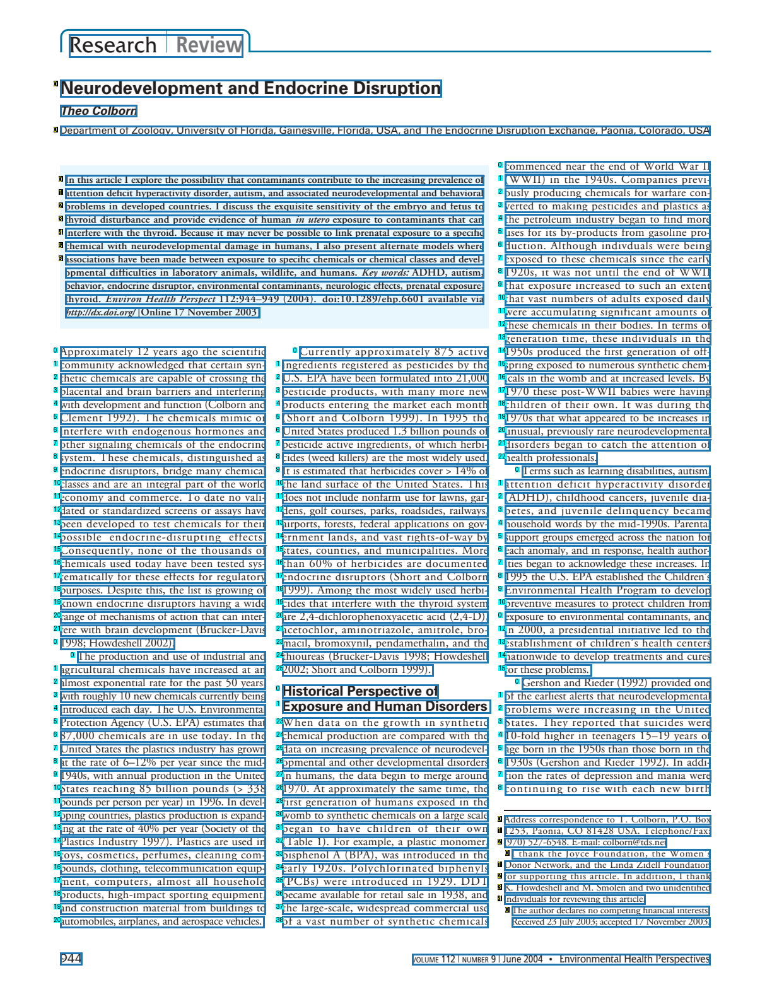

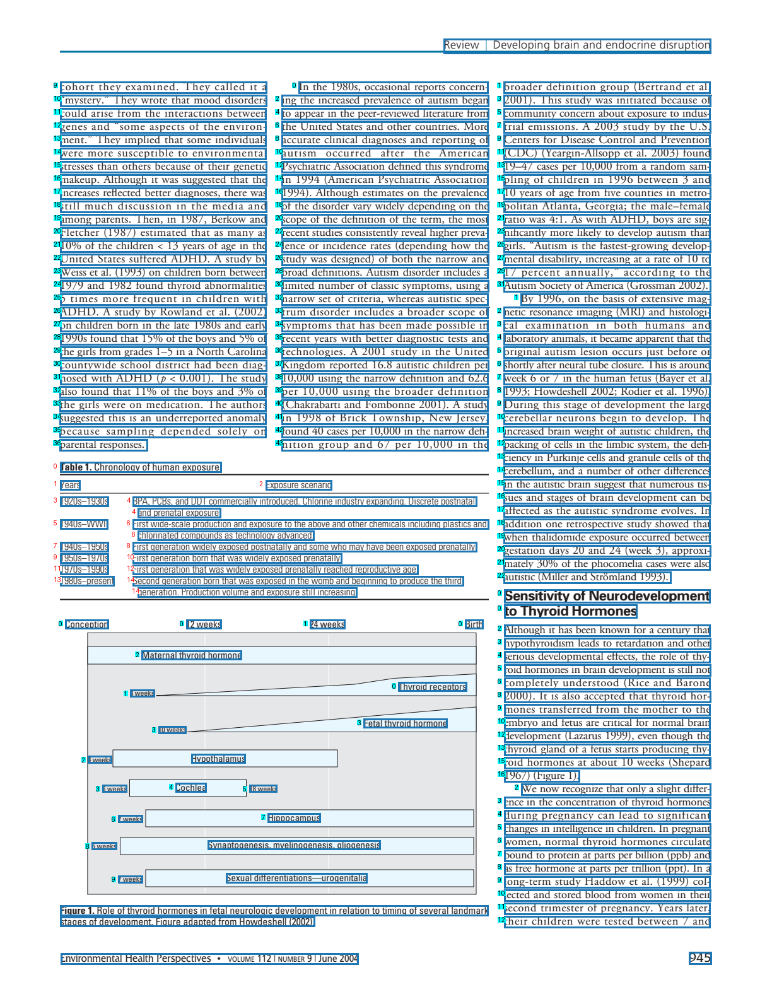

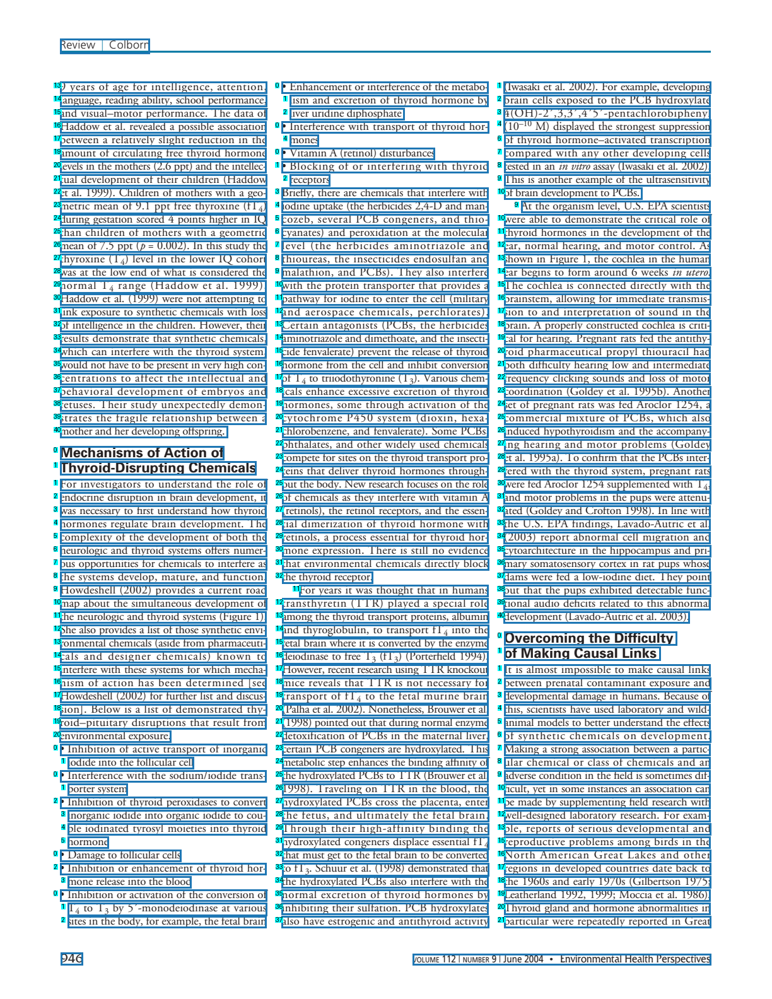

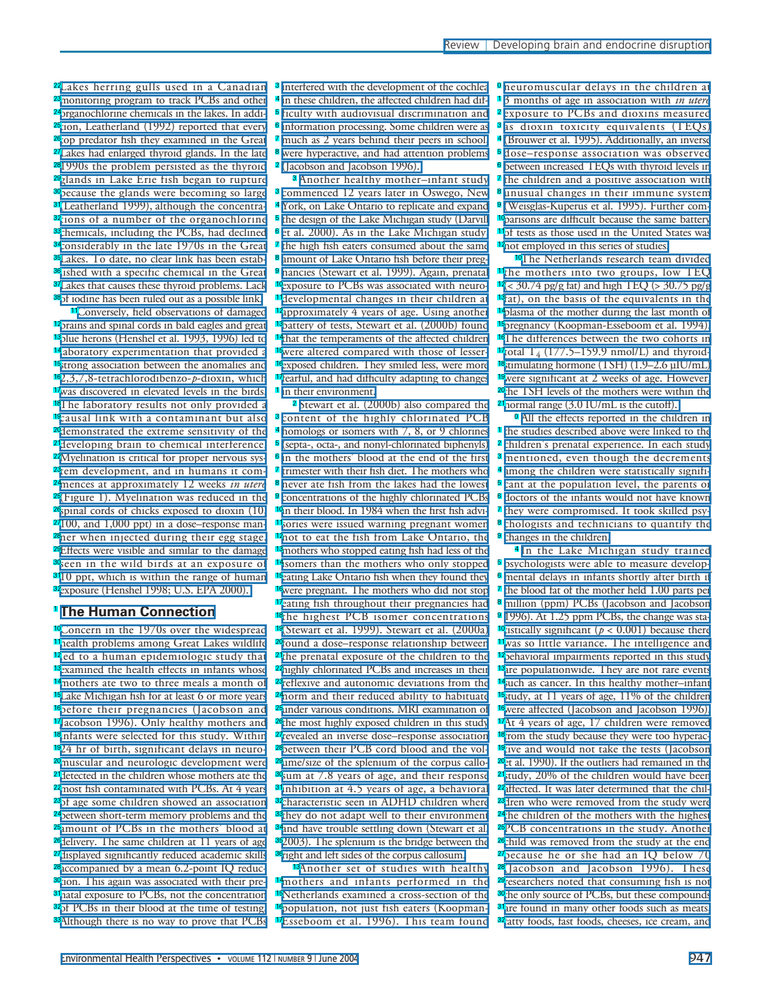

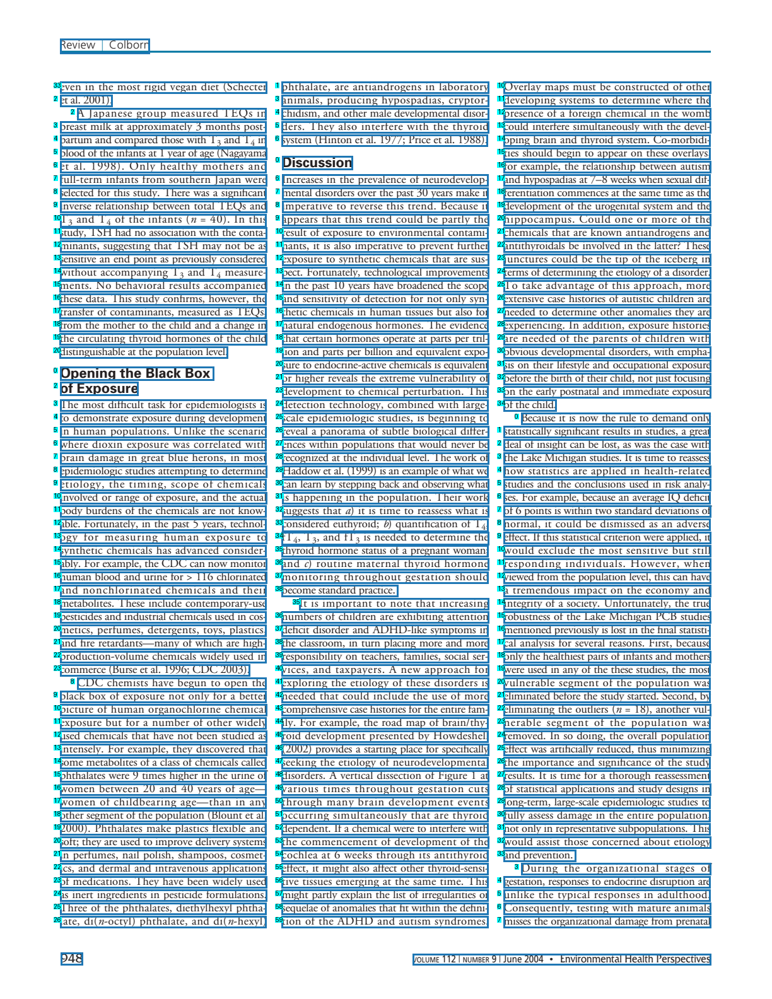

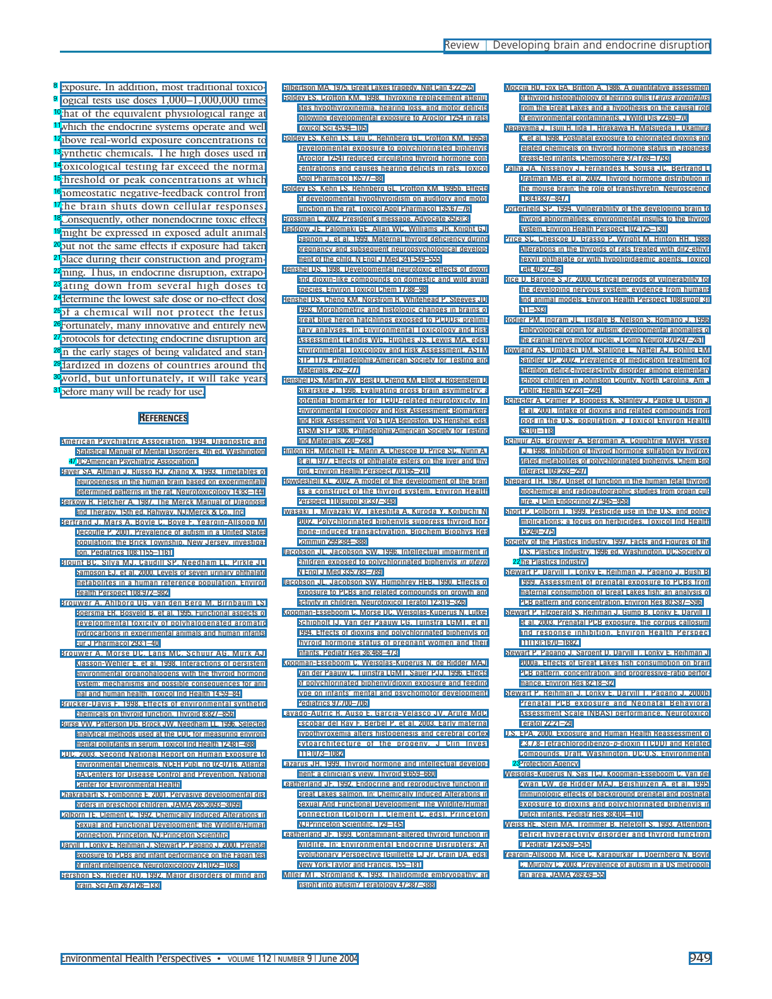

In [33]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)

In [34]:
# debug
# Not matched text boxes 


print(f'Nb text boxes not matched: {len(map_tboxes)}')

for tb in [v for _,v in map_tboxes.items()]:
    print(tb.page_num, f'{(tb.y0):.2f}', tb.text)

Nb text boxes not matched: 231
0 0.03 Research Review
0 0.11 Theo Colborn
0 0.27 opmental difficulties in laboratory animals, wildlife, and humans. Key words: ADHD, autism,
0 0.28 behavior, endocrine disruptor, environmental contaminants, neurologic effects, prenatal exposure,
0 0.29 thyroid. Environ Health Perspect 112:944–949 (2004). doi:10.1289/ehp.6601 available via
0 0.31 http://dx.doi.org/ [Online 17 November 2003]
0 0.92 Received 23 July 2003; accepted 17 November 2003.
0 0.95 944
0 0.95 VOLUME 112 | NUMBER 9 | June 2004 • Environmental Health Perspectives
1 0.04 Review | Developing brain and endocrine disruption
1 0.75 Hypothalamus
1 0.84 Synaptogenesis, myelinogenesis, gliogenesis
1 0.87 Sexual differentiations—urogenitalia
1 0.91 Figure 1. Role of thyroid hormones in fetal neurologic development in relation to timing of several landmark
1 0.92 stages of development. Figure adapted from Howdeshell (2002).
1 0.95 Environmental Health Perspectives • VOLUME 112 | NUMBER 9 | June 

In [24]:
#debug



# file_dir = base_dir + 'xmls/PMC1247186'
# pdf_path, xml_path = get_paths(file_dir = file_dir)

# xml = open(xml_path, 'rb')
# tree = etree.parse(xml)

# displayXMLInline(tree)